In [1]:
#importing the necessary modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler
from sklearn import metrics
from sklearn .metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn .metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

*Week 01:*

**Objective:-**
To set up the project environment and gather the necessary data for model development.

In [2]:
# Loading the given dataset as 'credit_df'
credit_df = pd.read_csv('/content/credit.csv')

## **Data Preprocessing**

In [3]:
credit_df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.465380,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.465380,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.465380,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.465380,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.465380,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,155625,37932,4,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor
99996,155626,37932,5,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor
99997,155627,37932,6,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,155628,37932,7,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,24.028477,Low_spent_Large_value_payments,319.164979,Standard


In [4]:
credit_df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [5]:
# Get the shape of the 'credit_df'
df_shape = credit_df.shape

# Print the number of features and observations
print(f"Number of Features:{df_shape[1]-1}")
print(f"Number of Observations:{df_shape[0]}")

Number of Features:27
Number of Observations:100000


In [6]:
# Displaying information about the 'credit_df'
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

## **Missing Values**

In [7]:
# Checking missing value
if not credit_df.isna().sum().any():
    print("'credit_df' does not have any null values.")

'credit_df' does not have any null values.


## **Duplicate Values**

In [8]:
# Checking duplicate value
if not credit_df.duplicated().any():
    print("'credit_df' does not have any duplicate value.")

'credit_df' does not have any duplicate value.


## **Outliers Checking and Handling**

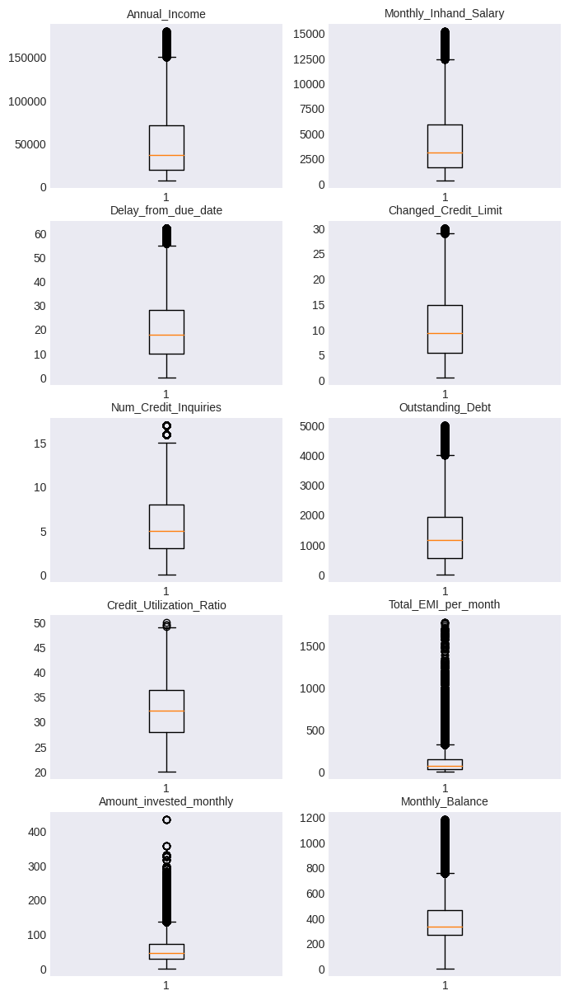

In [9]:
# Define the columns with potential outliers
outlier_columns = ['Annual_Income', 'Monthly_Inhand_Salary',
                   'Delay_from_due_date', 'Changed_Credit_Limit',
                   'Num_Credit_Inquiries', 'Outstanding_Debt',
                   'Credit_Utilization_Ratio', 'Total_EMI_per_month',
                   'Amount_invested_monthly', 'Monthly_Balance',]

# Setting the plot style and figure size
plt.style.use('seaborn-v0_8-dark')
plt.figure(figsize=(8,15))

# Iterate through the outlier columns and create boxplots
for n,i in zip(range(1,11),range(0,10)):
    plt.subplot(5,2,n)
    plt.boxplot(credit_df[outlier_columns[i]])
    plt.title(outlier_columns[i], fontsize=10)

# Display the plot
plt.show()

### Above result implies median values are better for replacing outliers.

In [10]:
#function to list out the outlier values
def detect_outliers_iqr(data):
    outliers = []
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    for i in data:
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers

In [11]:
#outliers with median value
for feature in outlier_columns:
    outliers = detect_outliers_iqr(credit_df[feature])
    impute_value = credit_df[feature].median()
    filter = credit_df[feature] >= np.min(outliers)
    credit_df.loc[filter,feature] = impute_value

In [12]:
# Dropping Irrelevant features
credit_df.drop(['ID','Customer_ID','SSN'],axis=1, inplace=True)

## **EDA**

In [13]:
#arranging numerical and categorical columns
credit_cal=credit_df.select_dtypes(include='object')
credit_num=credit_df.select_dtypes(include='number')

In [14]:
credit_cal.describe().T

,count,unique,top,freq
Name,100000,10128,Jessicad,48
Occupation,100000,15,Lawyer,7096
Type_of_Loan,100000,6261,No Data,11408
Credit_Mix,100000,3,Standard,45848
Payment_of_Min_Amount,100000,3,Yes,52326
Payment_Behaviour,100000,6,Low_spent_Small_value_payments,28616
Credit_Score,100000,3,Standard,53174


In [15]:
for cat_col in credit_cal:
    print(credit_cal[cat_col].value_counts())
    print('\n-------------')

Jessicad              48
Langep                48
Stevex                48
Vaughanl              40
Ronald Groverk        40
                      ..
Breidthardtj           8
Sven Egenterx          8
Antonella Ciancioc     8
Valentina Zan          8
Nicks                  8
Name: Name, Length: 10128, dtype: int64

-------------
Lawyer           7096
Engineer         6864
Architect        6824
Mechanic         6776
Scientist        6744
Accountant       6744
Developer        6720
Media_Manager    6720
Teacher          6672
Entrepreneur     6648
Doctor           6568
Journalist       6536
Manager          6432
Musician         6352
Writer           6304
Name: Occupation, dtype: int64

-------------
No Data                                                                                                                               11408
Not Specified                                                                                                                          1408
Credit-Builder

### Count Plot

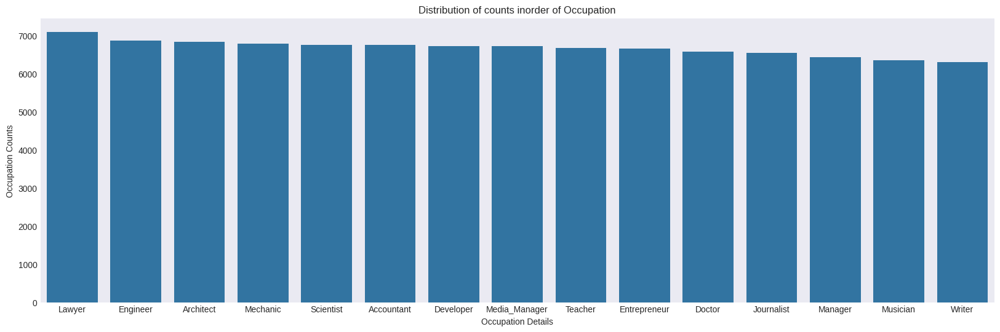

In [16]:
#occupation
plt.figure(figsize=(20,6))
ax=sns.countplot(x='Occupation',data=credit_cal,order=credit_df['Occupation'].value_counts().index)
plt.title('Distribution of counts inorder of Occupation')
plt.xlabel('Occupation Details')
plt.ylabel("Occupation Counts")
plt.show()

### Inference: In this countplot we can under occupation 'Lawyer' have more counts.

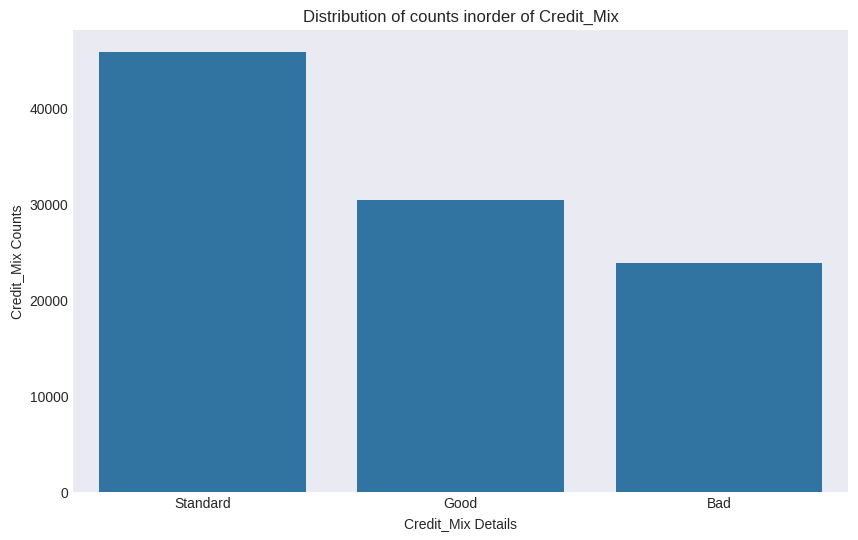

In [17]:
#credit mix
plt.figure(figsize=(10,6))
ax=sns.countplot(x='Credit_Mix',data=credit_cal,order=credit_df['Credit_Mix'].value_counts().index)
plt.title('Distribution of counts inorder of Credit_Mix')
plt.xlabel('Credit_Mix Details')
plt.ylabel("Credit_Mix Counts")
plt.show()

### Inference:- In this countplot the credit mix count is high in standard

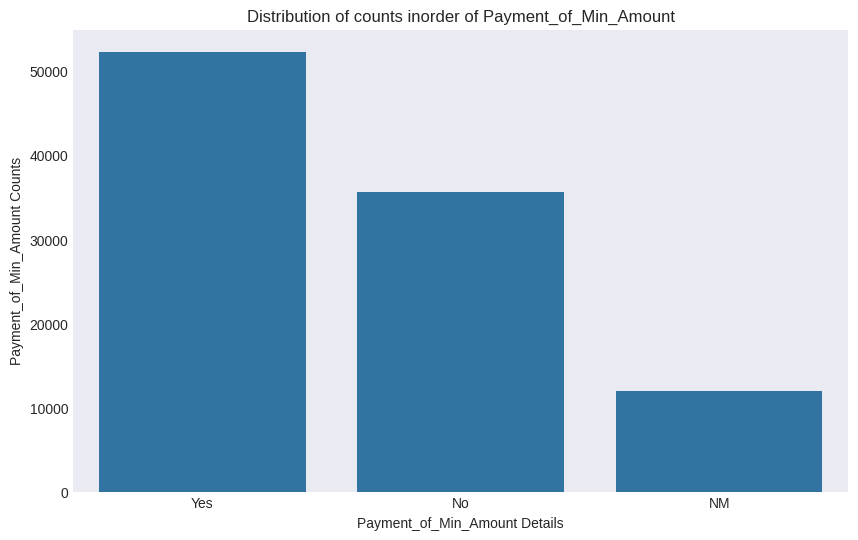

In [18]:
#Payment_of_Min_Amount
plt.figure(figsize=(10,6))
ax=sns.countplot(x='Payment_of_Min_Amount',data=credit_cal,order=credit_df['Payment_of_Min_Amount'].value_counts().index)
plt.title('Distribution of counts inorder of Payment_of_Min_Amount')
plt.xlabel('Payment_of_Min_Amount Details')
plt.ylabel("Payment_of_Min_Amount Counts")
plt.show()

### Inference:- In the plot above the minimum amount of payment count is high for standard count.

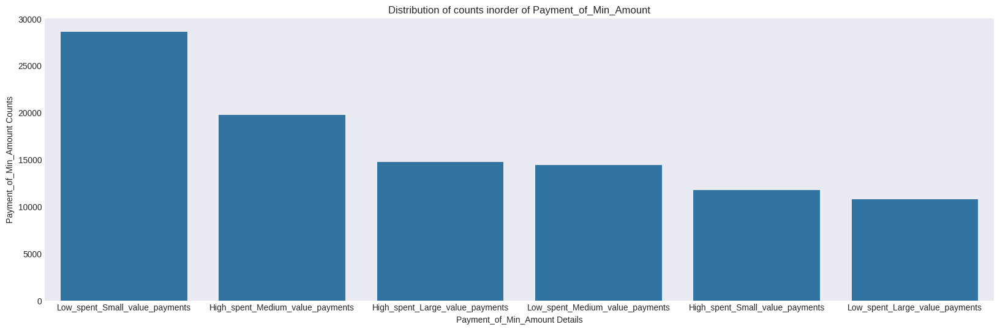

In [19]:
#Payment_Behaviour
plt.figure(figsize=(20,6))
ax=sns.countplot(x='Payment_Behaviour',data=credit_cal,order=credit_df['Payment_Behaviour'].value_counts().index)
plt.title('Distribution of counts inorder of Payment_of_Min_Amount')
plt.xlabel('Payment_of_Min_Amount Details')
plt.ylabel("Payment_of_Min_Amount Counts")
plt.show()

### Inference:- In this graph we can see in payment behavior low_spent_small_value_payments is high

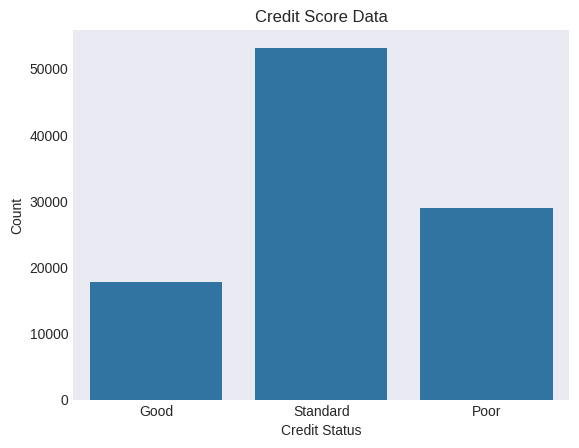

In [20]:
ax = sns.countplot(x = 'Credit_Score',data = credit_df)
plt.title('Credit Score Data')
plt.xlabel('Credit Status')
plt.ylabel('Count')
plt.show()

### Inference:- In this countplot of credit scores reveals a roughly symmetric distribution, indicating that the majority of individuals have credit scores clustered around the central tendency

In [21]:
#to get statistics value of credit_num
credit_num.describe().T

,count,mean,std,min,25%,50%,75%,max
Month,100000.0,4.500000,2.291299,1.000000,2.750000,4.500000,6.250000,8.000000
Age,100000.0,33.316340,10.764812,14.000000,24.000000,33.000000,42.000000,56.000000
Annual_Income,100000.0,47923.090915,34570.337168,7005.930000,19342.972500,36998.267500,68754.597500,150131.680000
Monthly_Inhand_Salary,100000.0,3981.159050,2873.322586,303.645417,1626.594167,3095.905000,5708.265000,12452.330000
Num_Bank_Accounts,100000.0,5.368820,2.593314,0.000000,3.000000,5.000000,7.000000,11.000000
Num_Credit_Card,100000.0,5.533570,2.067098,0.000000,4.000000,5.000000,7.000000,11.000000
Interest_Rate,100000.0,14.532080,8.741330,1.000000,7.000000,13.000000,20.000000,34.000000
Num_of_Loan,100000.0,3.532880,2.446356,0.000000,2.000000,3.000000,5.000000,9.000000
Delay_from_due_date,100000.0,19.437290,12.605361,0.000000,10.000000,18.000000,26.000000,55.000000
Num_of_Delayed_Payment,100000.0,13.313120,6.237166,0.000000,9.000000,14.000000,18.000000,25.000000


### Pair Plot

Text(0.5, 1.02, 'Pairplot of Numerical Variables')

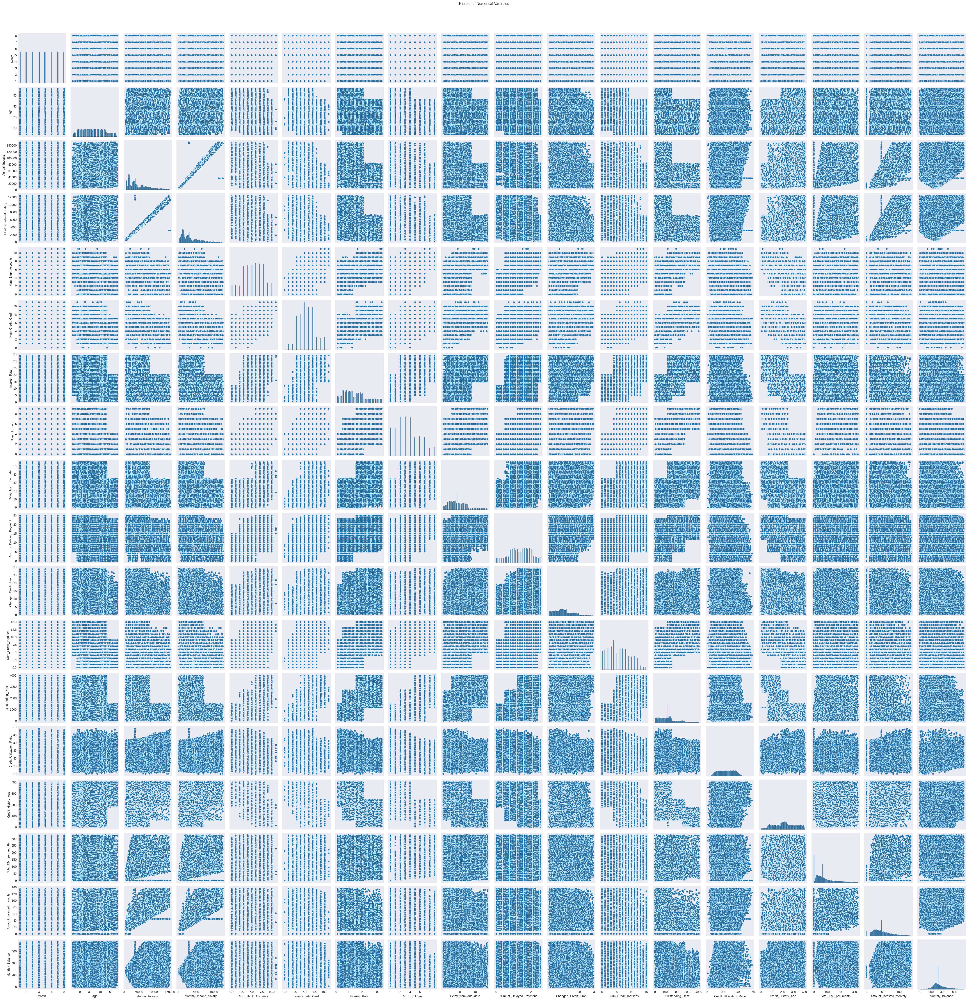

In [22]:
sns.pairplot(credit_num)
plt.suptitle('Pairplot of Numerical Variables', y=1.02)

In [23]:
corr_format= credit_num.corr()
corr_format

,Month,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Month,1.000000e+00,0.016990,-1.177001e-17,-0.001272,0.000079,0.000090,6.790115e-18,1.555542e-16,-0.000413,0.000115,-0.000874,0.128485,-3.628566e-17,0.002454,0.022784,0.009003,-9.060843e-17,-0.001129
Age,1.698955e-02,1.000000,8.537603e-02,0.083374,-0.190415,-0.148567,-2.175571e-01,-2.135330e-01,-0.168641,-0.184264,-0.159220,-0.249374,-1.909457e-01,0.025419,0.234618,-0.073007,5.245280e-02,0.096391
Annual_Income,-1.177001e-17,0.085376,1.000000e+00,0.989520,-0.238342,-0.197399,-2.671849e-01,-2.349467e-01,-0.202051,-0.229456,-0.141619,-0.251284,-2.394714e-01,0.145415,0.246819,0.405846,6.897849e-01,0.370586
Monthly_Inhand_Salary,-1.271756e-03,0.083374,9.895200e-01,1.000000,-0.237362,-0.197451,-2.668503e-01,-2.338182e-01,-0.202377,-0.229503,-0.142410,-0.251175,-2.390547e-01,0.145219,0.247085,0.404664,6.931688e-01,0.372346
Num_Bank_Accounts,7.909795e-05,-0.190415,-2.383421e-01,-0.237362,1.000000,0.442694,5.843015e-01,4.724831e-01,0.528898,0.601842,0.324094,0.512716,4.600386e-01,-0.071649,-0.485331,0.101531,-1.780112e-01,-0.224022
Num_Credit_Card,8.973261e-05,-0.148567,-1.973995e-01,-0.197451,0.442694,1.000000,4.979115e-01,4.179595e-01,0.438829,0.423300,0.243010,0.452946,4.396208e-01,-0.055194,-0.417205,0.106442,-1.516962e-01,-0.196047
Interest_Rate,6.790115e-18,-0.217557,-2.671849e-01,-0.266850,0.584302,0.497912,1.000000e+00,5.591562e-01,0.534451,0.571457,0.357507,0.625316,5.856638e-01,-0.075639,-0.576230,0.136710,-2.040545e-01,-0.257863
Num_of_Loan,1.555542e-16,-0.213533,-2.349467e-01,-0.233818,0.472483,0.417960,5.591562e-01,1.000000e+00,0.455249,0.473919,0.358290,0.562555,5.400546e-01,-0.100311,-0.605727,0.446019,-1.773190e-01,-0.375625
Delay_from_due_date,-4.128817e-04,-0.168641,-2.020512e-01,-0.202377,0.528898,0.438829,5.344505e-01,4.552487e-01,1.000000,0.513362,0.275595,0.484764,4.563819e-01,-0.060748,-0.449962,0.122672,-1.570050e-01,-0.208974
Num_of_Delayed_Payment,1.154567e-04,-0.184264,-2.294564e-01,-0.229503,0.601842,0.423300,5.714569e-01,4.739186e-01,0.513362,1.000000,0.318969,0.495574,4.441880e-01,-0.073633,-0.481965,0.111956,-1.866756e-01,-0.218577


### Heat Map

<Axes: >

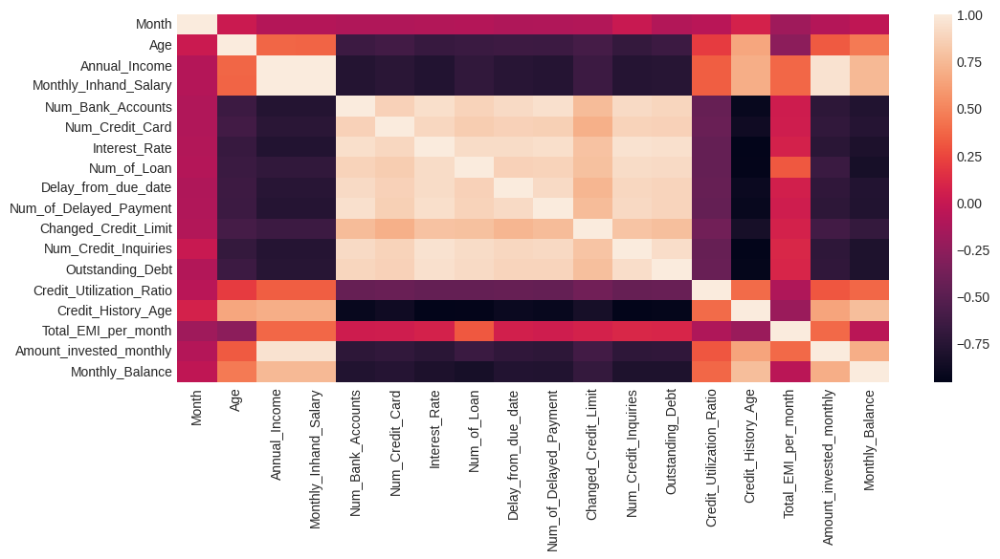

In [24]:
#correlation Analysis
plt.figure(figsize=(12,5))
sns.heatmap(corr_format.corr())

In [25]:
numeric_cols= credit_df.select_dtypes(exclude='object').columns
cat_cols= credit_df.select_dtypes(include='object').columns
numeric_cols

Index(['Month', 'Age', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance'],
      dtype='object')

In [26]:
cat_cols

Index(['Name', 'Occupation', 'Type_of_Loan', 'Credit_Mix',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [27]:
vif_credit_df = credit_df[numeric_cols]
vif_data =pd.DataFrame()
vif_data["Feature"]=vif_credit_df.columns
vif_data["VIF"]=[variance_inflation_factor(vif_credit_df.values,i) for i in range(len(vif_credit_df.columns))]
vif_data.head(17)

,Feature,VIF
0,Month,4.957805
1,Age,10.214075
2,Annual_Income,141.138586
3,Monthly_Inhand_Salary,141.871313
4,Num_Bank_Accounts,10.408261
5,Num_Credit_Card,11.881539
6,Interest_Rate,9.083604
7,Num_of_Loan,8.415696
8,Delay_from_due_date,5.792755
9,Num_of_Delayed_Payment,10.469331


### Box Plot

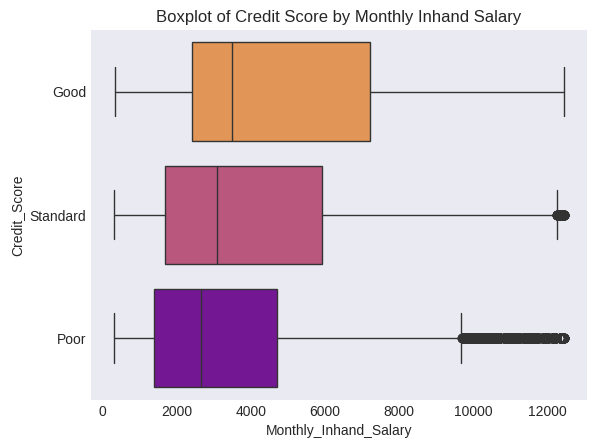

In [28]:
sns.boxplot(data=credit_df, x='Monthly_Inhand_Salary', y='Credit_Score', palette='plasma_r')
plt.title("Boxplot of Credit Score by Monthly Inhand Salary")
plt.show()

In [29]:
credit_df.drop(['Name'],axis=1, inplace=True)


In [30]:
credit_df['Occupation'].unique()

array(['Scientist', 'Teacher', 'Engineer', 'Entrepreneur', 'Developer',
       'Lawyer', 'Media_Manager', 'Doctor', 'Journalist', 'Manager',
       'Accountant', 'Musician', 'Mechanic', 'Writer', 'Architect'],
      dtype=object)

In [31]:
credit_df['Type_of_Loan'].unique()

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
       ..., 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan',
       'Payday Loan, Student Loan, Mortgage Loan, and Not Specified',
       'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan'],
      dtype=object)

In [32]:
credit_df['Credit_Mix'].unique()

array(['Good', 'Standard', 'Bad'], dtype=object)

In [33]:
credit_df['Payment_of_Min_Amount'].unique()

array(['No', 'NM', 'Yes'], dtype=object)

In [34]:
credit_df['Payment_Behaviour'].unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'High_spent_Large_value_payments'], dtype=object)

In [35]:
credit_df['Credit_Score'].unique()

array(['Good', 'Standard', 'Poor'], dtype=object)

### Normalization

In [36]:
from sklearn.preprocessing import Normalizer, LabelEncoder


Occupation_en = LabelEncoder().fit_transform(credit_df['Occupation'])
credit_df['Occupation'] = pd.DataFrame(Occupation_en,columns=['Occupation'])



Type_of_Loan_en = LabelEncoder().fit_transform(credit_df['Type_of_Loan'])
credit_df['Type_of_Loan'] = pd.DataFrame(Type_of_Loan_en,columns=['Type_of_Loan'])

Payment_of_Min_Amount_en = LabelEncoder().fit_transform(credit_df['Payment_of_Min_Amount'])
credit_df['Payment_of_Min_Amount'] = pd.DataFrame(Payment_of_Min_Amount_en,columns=['Payment_of_Min_Amount'])

Payment_Behaviour_en = LabelEncoder().fit_transform(credit_df['Payment_Behaviour'])
credit_df['Payment_Behaviour'] = pd.DataFrame(Payment_Behaviour_en,columns=['Payment_Behaviour'])

Credit_Mix_en = LabelEncoder().fit_transform(credit_df['Credit_Mix'])
credit_df['Credit_Mix'] = pd.DataFrame(Credit_Mix_en,columns=['Credit_Mix'])

Credit_Score_en = LabelEncoder().fit_transform(credit_df['Credit_Score'])
credit_df['Credit_Score'] = pd.DataFrame(Credit_Score_en,columns=['Credit_Score'])

In [37]:
credit_df

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,1,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,128,...,1,809.98,26.822620,265.0,1,49.574949,21.465380,2,312.494089,0
1,2,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,128,...,1,809.98,31.944960,266.0,1,49.574949,21.465380,3,284.629162,0
2,3,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,128,...,1,809.98,28.609352,267.0,1,49.574949,21.465380,4,331.209863,0
3,4,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,128,...,1,809.98,31.377862,268.0,1,49.574949,21.465380,5,223.451310,0
4,5,23.0,12,19114.12,1824.843333,3.0,4.0,3.0,4.0,128,...,1,809.98,24.797347,269.0,1,49.574949,21.465380,1,341.489231,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,4,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,683,...,1,502.38,34.663572,378.0,1,35.104023,24.028477,0,479.866228,1
99996,5,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,683,...,1,502.38,40.565631,379.0,1,35.104023,24.028477,1,496.651610,1
99997,6,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,683,...,1,502.38,41.255522,380.0,1,35.104023,24.028477,0,516.809083,1
99998,7,25.0,9,39628.99,3359.415833,4.0,6.0,7.0,2.0,683,...,1,502.38,33.638208,381.0,1,35.104023,24.028477,3,319.164979,2


## **Splitting Data**

In [38]:
df_train_x = credit_df.drop('Credit_Score',axis = 1)
df_train_y = credit_df['Credit_Score']
x_train, x_test, y_train, y_test = train_test_split(df_train_x, df_train_y, test_size=0.3, random_state=42)

In [39]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
x_train_samp, y_train_samp = sm.fit_resample(x_train, y_train)
unique, counts = np.unique(y_train_samp, return_counts=True)
print(dict(zip(unique, counts)))


{0: 37301, 1: 37301, 2: 37301}


In [40]:
x_train, x_test, y_train, y_test = train_test_split(x_train_samp, y_train_samp, test_size=0.3, random_state=42)

### Building model

In [41]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
models = [['LogisticRegression ', LogisticRegression()],
        ['DecisionTreeClassifier ', DecisionTreeClassifier()],
        ['RandomForestClassifier ', RandomForestClassifier()],['SVC ', SVC()],['KNeighborsClassifier ', KNeighborsClassifier()]]

In [ ]:
for name, model in models:
    model = model
    model.fit(x_train, y_train)
    prediction = model.predict(x_test)
    print(name, accuracy_score(y_test, prediction))

LogisticRegression  0.5608114146138036
DecisionTreeClassifier  0.7846951237675375
RandomForestClassifier  0.8699770635369813


In [ ]:
model_params = {

    'DecisionTreeClassifier  ': {
        'model': DecisionTreeClassifier(),
        'params' : {
            'criterion' : ['gini', 'entropy']
        }
    },
    'Random_forest': {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10]
        }
    }

}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
best_models = []

for model_name, mp in model_params.items():
    # GridSearchCV
    clf_grid = GridSearchCV(mp['model'], mp['params'], cv=5)
    clf_grid.fit(x_train, y_train)

    # Evaluate using different metrics
    y_pred_grid = clf_grid.predict(x_test)
    accuracy_grid = accuracy_score(y_test, y_pred_grid)
    precision_grid = precision_score(y_test, y_pred_grid, average='macro')
    recall_grid = recall_score(y_test, y_pred_grid, average='macro')
    f1_grid = f1_score(y_test, y_pred_grid, average='macro')
    roc_auc_grid = roc_auc_score(y_test, clf_grid.predict_proba(x_test), multi_class='ovr')


    best_models.append({
        'model': model_name + ' (GridSearchCV)',
        'accuracy': accuracy_grid,
        'precision': precision_grid,
        'recall': recall_grid,
        'f1-score': f1_grid,
        'roc_auc_score': roc_auc_grid


    })

    # RandomizedSearchCV
    clf_random = RandomizedSearchCV(mp['model'], mp['params'], n_iter=10, cv=5, return_train_score=False)
    clf_random.fit(x_train, y_train)

    # Evaluate using different metrics
    y_pred_random = clf_random.predict(x_test)
    accuracy_random = accuracy_score(y_test, y_pred_random)
    precision_random = precision_score(y_test, y_pred_random, average='macro')
    recall_random = recall_score(y_test, y_pred_random, average='macro')
    f1_random = f1_score(y_test, y_pred_random, average='macro')
    roc_auc_random = roc_auc_score(y_test, clf_random.predict_proba(x_test), multi_class='ovr')

    best_models.append({
        'model': model_name + ' (RandomizedSearchCV)',
        'accuracy': accuracy_random,
        'precision': precision_random,
        'recall': recall_random,
        'f1-score': f1_random,
        'roc_auc_score': roc_auc_random

    })

# Print the evaluation results for each model
for model in best_models:
    print("Model:", model['model'])
    print("Accuracy:", model['accuracy'])
    print("Precision:", model['precision'])
    print("Recall:", model['recall'])
    print("F1-score:", model['f1-score'])
    print("ROC-AUC Score:", model['roc_auc_score'])
    print("-------------------------------------------")

print("model  =", model['model'], "best_score =", model['accuracy'])